# Random Forests Regression

Random Forests Classifiers are built for both classification and regression tasks. The use of multiple trees serve to reduce overfitting. I works with large data providing very high accuracy.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

## Dataset

In [3]:
df = pd.read_csv('../xdata/Position_Salaries.csv')
df.head()

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000


In [4]:
X = df["Level"].values
y = df["Salary"].values

X= np.array(X).reshape(-1,1)
y= np.array(y).reshape(-1,1)

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

## Feature Scalling

In [6]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)
sc_y = StandardScaler()
y_train = sc_y.fit_transform(y_train)

## Model Training

In [7]:
model = RandomForestRegressor(random_state = 0)
model.fit(X,y)

/Users/johnmoses/miniforge3/envs/mforge39/lib/python3.9/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestRegressor(random_state=0)

In [9]:
df.Level

0     1
1     2
2     3
3     4
4     5
5     6
6     7
7     8
8     9
9    10
Name: Level, dtype: int64

Estimators

In [10]:
len(model.estimators_)

100

/var/folders/98/pgyvqp115_q7lctf5vvv65gr0000gp/T/ipykernel_10657/1039263673.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,10))


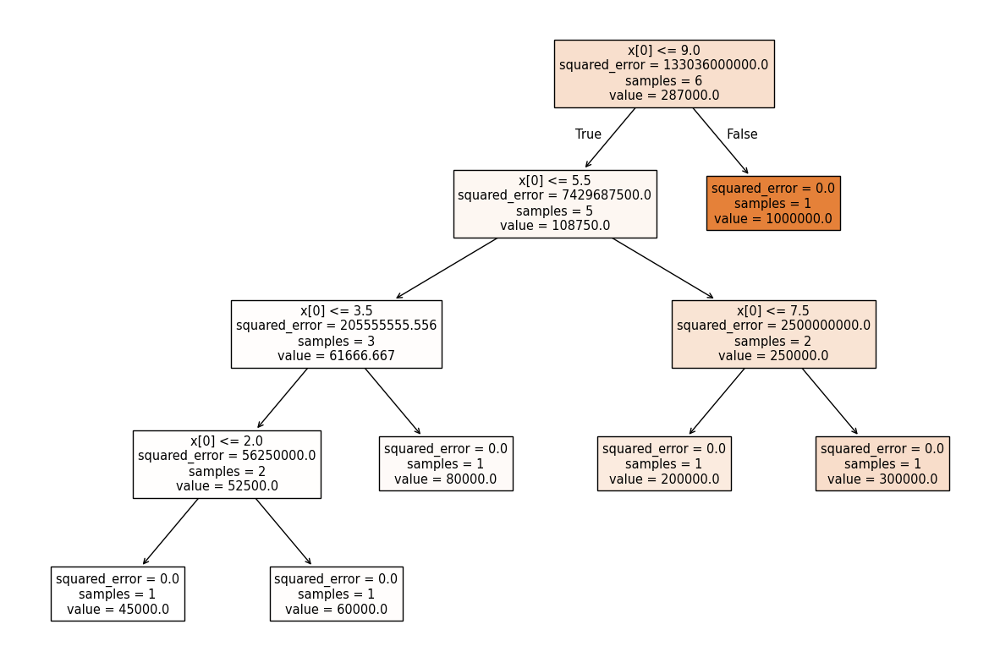

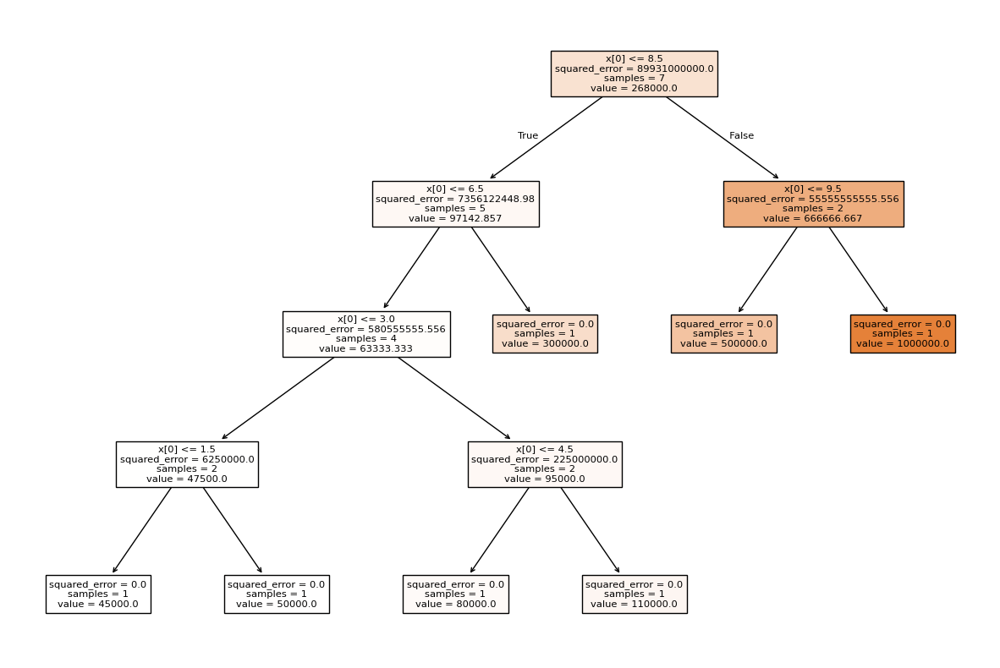

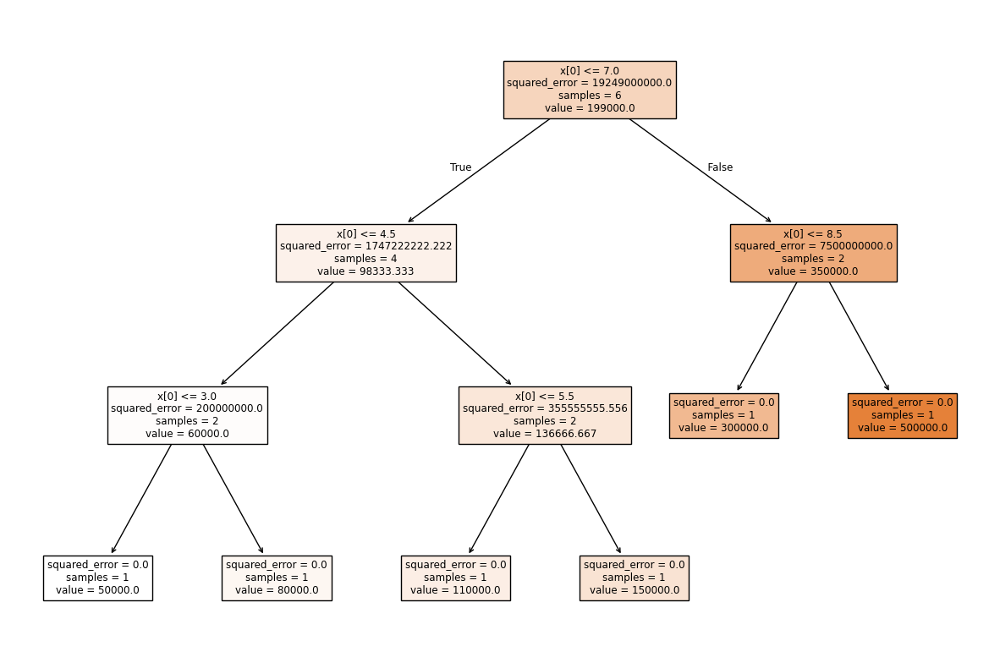

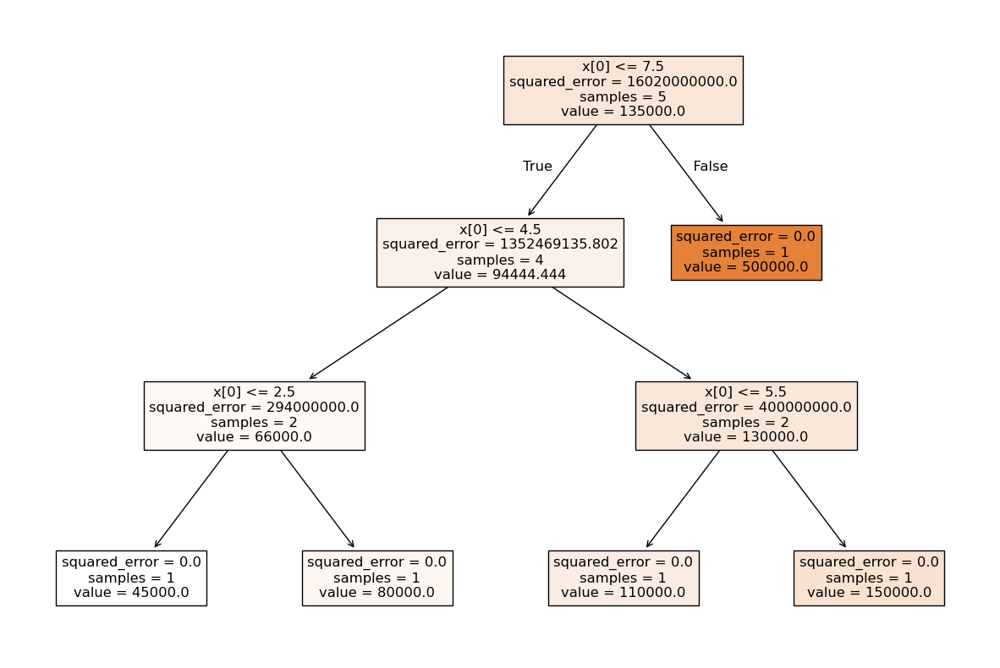

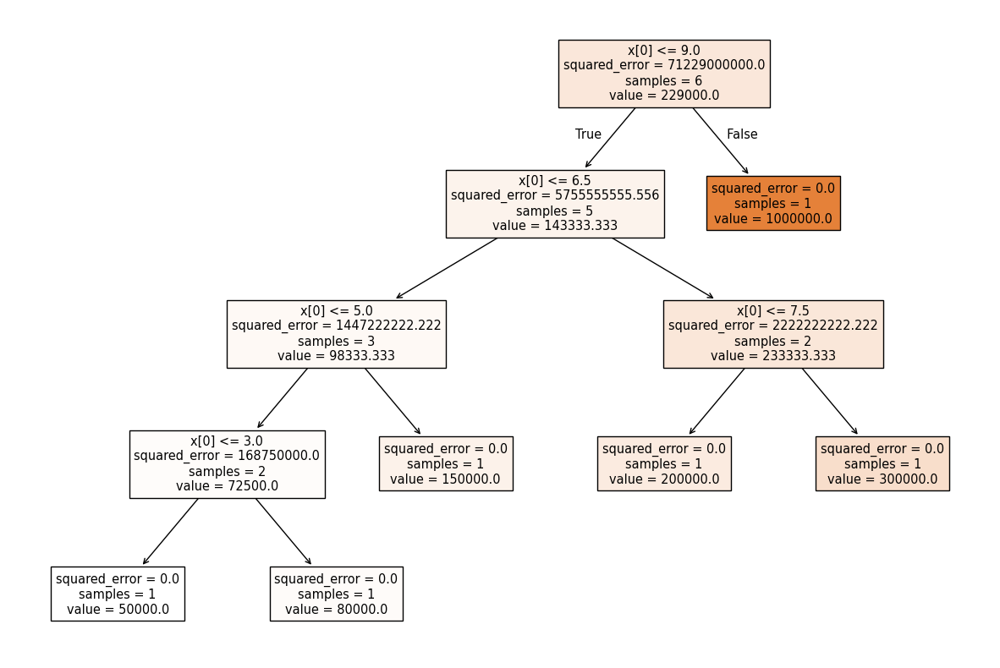

...

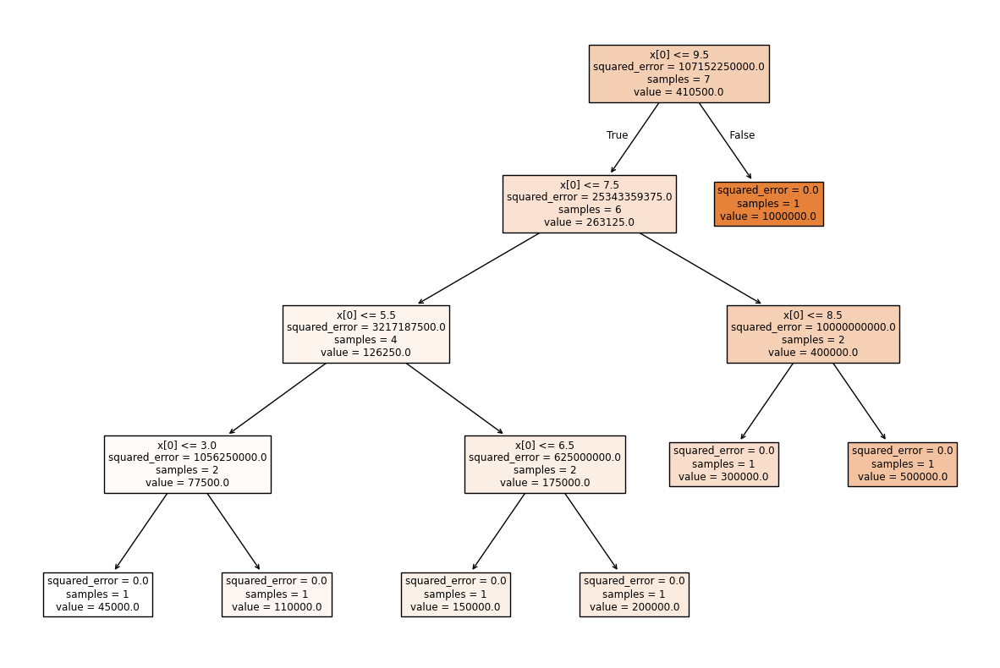

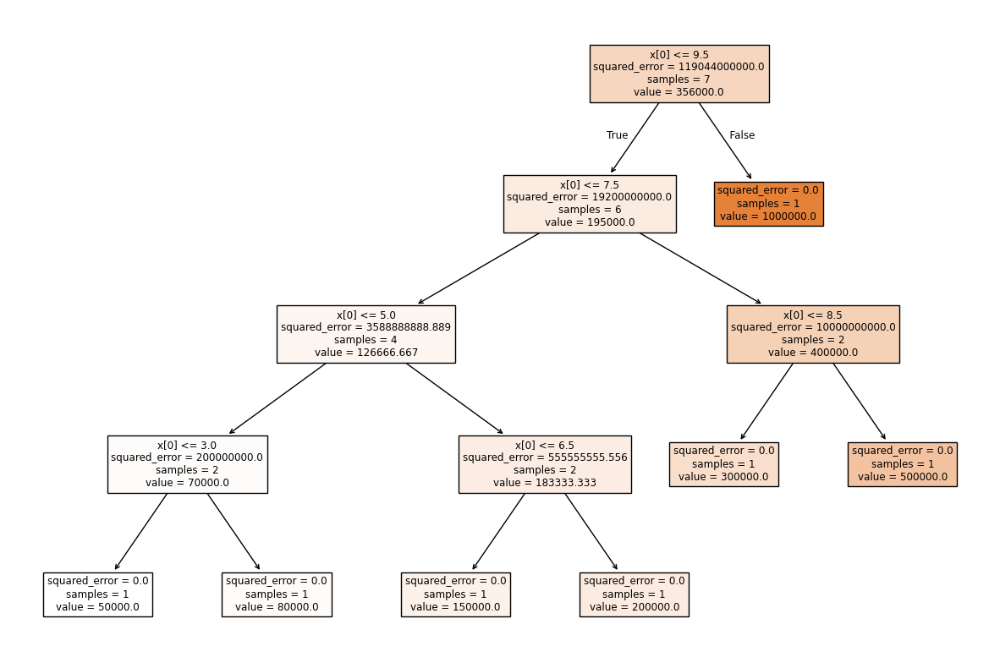

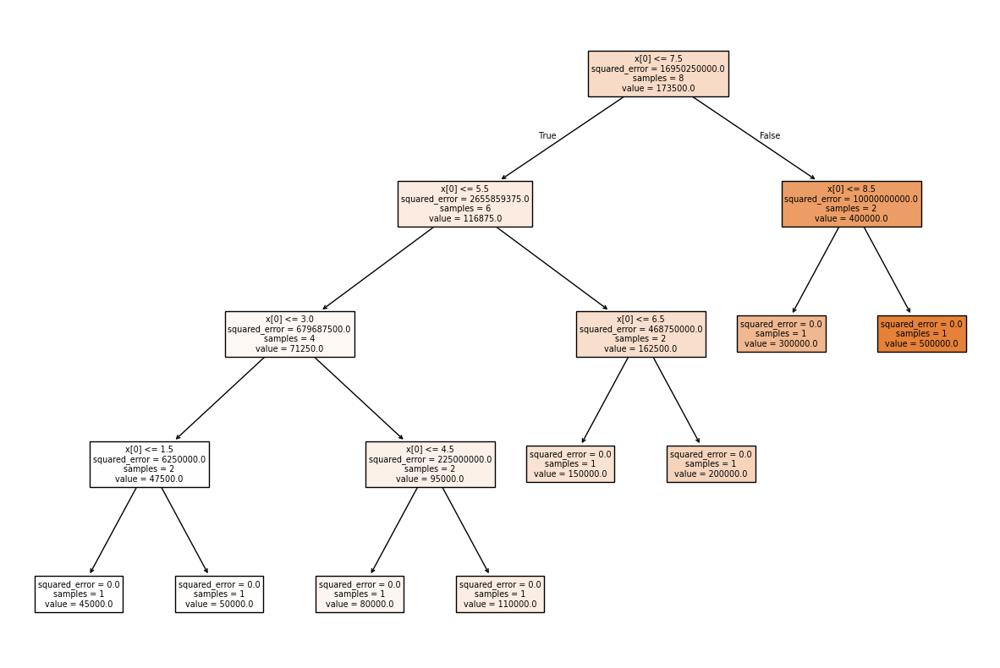

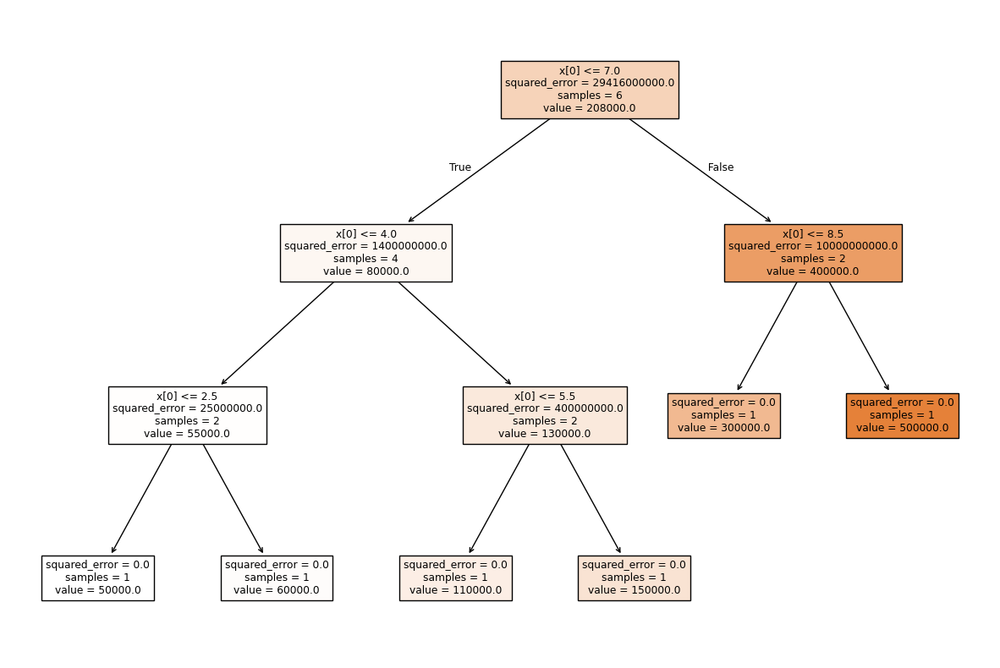

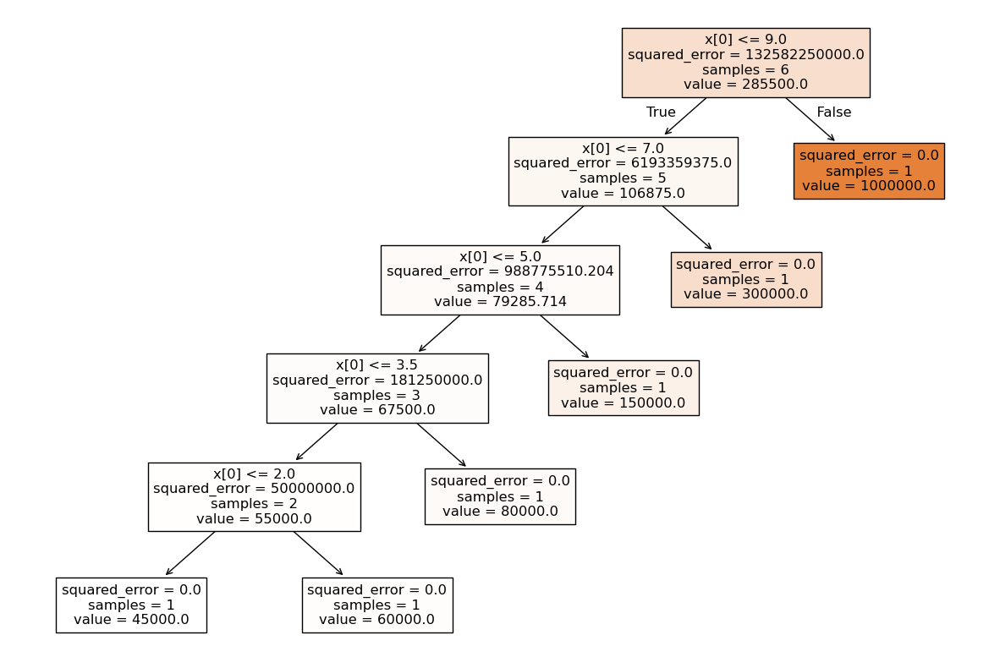

In [12]:
for i in range(0,100):
    plt.figure(figsize=(15,10))
    tree.plot_tree(model.estimators_[i],filled=True)

In [14]:
y_pred = model.predict([[6.5]])
y_pred

array([158300.])

## Evaluation

In [15]:
from sklearn.metrics import mean_squared_error
import math

regression_model_mse = mean_squared_error(y_test,model.predict(X_test))
print('Mean Squared Error:\t',math.sqrt(regression_model_mse))
print("R squared value\t\t",model.score(X,y))

Mean Squared Error:	 319833.74196604086
R squared value		 0.9378393331453065


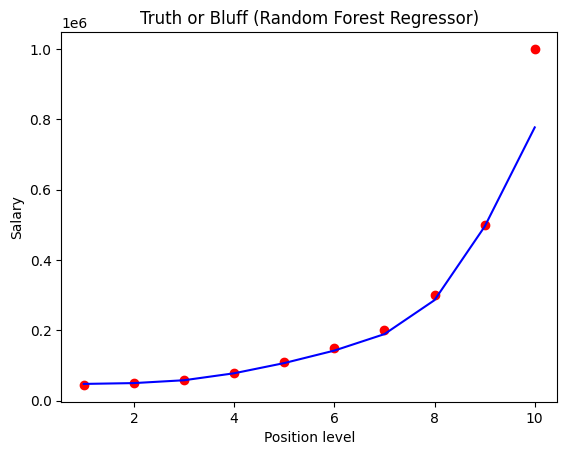

In [16]:
plt.scatter(X,y, color = 'red')
plt.plot(X, model.predict(X), color = 'blue')
plt.title('Truth or Bluff (Random Forest Regressor)')
plt.xlabel('Position level')
plt.ylabel('Salary')
plt.show()